# A first example of a numerical simulation

In this exercise, you will conduct a first instance of numerical simulation of the time evolution of a system. We will solve an advection equation of the form

$$\frac{\partial u}{\partial t} + a \frac{\partial u}{\partial x} = 0  \tag{1}$$

with $a$ being a __constant__. In subsequent exercises, more general cases will be considered, with $a$ no longer constant.

In [1]:
# Importing relevant libraries 
import numpy as np
import matplotlib.pyplot as plt 
from nm_lib import nm_lib as nm
from matplotlib import animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# plt.style.use('dark_background')
plt.style.use('default')
plt.rcParams['axes.grid'] = True

## 1 – The $a = const$ case: the mathematical problem

We would like to solve equation (1) numerically for $x  [x_0, x_f]$ with $x_0 = −2.6$, $x_f = 2.6$, periodic boundary conditions and with the initial condition:

$$u(x,t=t_0) = \cos^2 \left(\frac{6 \pi x}{5} \right) / \cosh(5x^2) \tag{2}$$

In [2]:
def u(x, t=False): 
    """ 
    Solves the initial condition for u(x, t=t0) from equation 2). 
    Valid when a = const 

    Parameters
    ----------
    x : `array`
       Spatial axis. 
    t : `bool`
       
    Returns
    ------- 
    `array`
        Initial condition of u(x, t=t0)
    """
    return np.cos(6*np.pi*x / 5)**2 / (np.cosh(5*x**3))

<span style="color:pink">

We start by representing that function in the given interval.

</span>

Text(0.5, 0, 'x interval')

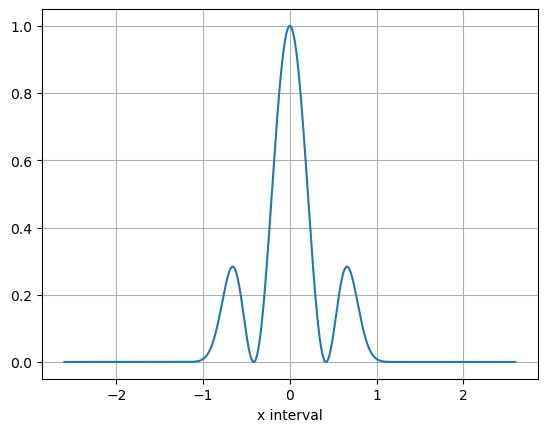

In [3]:
x0 = -2.6 
xf =  2.6 
x_interval = np.linspace(x0, xf, 1000)
uu = u(x_interval)

plt.plot(x_interval, uu)
plt.xlabel("x interval")

<span style="color:pink">

The plot above visualizes the function from equation 2) over an interval $x\in[-2.6, 2.6]$. 

</span>

## 2 – Spatial derivative.

We discretize the initial condition by subdividing the spatial domain into $nint=64$ equal intervals. The function will therefore be sampled with $nump=65$ points, namely $(u_0, u_1, u_2, ... , u_{nump−1})$ at equidistant values of the abscissa, $(x_0, x_1, x_2, ..., x_{nump−1})$. Let us calculate the spatial derivative of the function through non-centered finite differences of the form:

$$\left(\frac{\partial u}{\partial x}\right)_{x=x_i} \rightarrow \frac{u_{i}-u_{i-1}}{\Delta x}  \tag{3}$$

On the basis of the experience gained with the previous batch of exercises (ex. 1), which order of approximation can we expect now for the calculation of the derivative since we are using non-centered finite differences?

<span style="color:pink">

The centered difference yields an order of approximation $O(h^2)$, as we learned from exercise 1. 

</span>

## 3 – Time advance.

We want to calculate an approximation to the value of the function at times later than $t = t_0$, for instance, at time $t_0 + \Delta t$. To that end, we carry out a discretization of the time axis, calculating approximate values for the time derivative as follows:

$$\left(\frac{\partial u}{\partial t}\right)_{\underset{t=t_0}{x=x_i}} \rightarrow \frac{u_i(t_0 + \Delta t)-u_i(t_0)}{\Delta t}\tag{4}$$

Using now the differential equation (1) and expression (3), we can calculate an approximate value for the function $u$ at $x_i$ and time $t_0 + \Delta t$ as follows:

$$u_i(t_0+\Delta t) = u_i(t_0) - a \frac{u_{i}(t_0) - u_{i-1}(t_0)}{\Delta x}\Delta t  \tag{5}$$

Using (5), calculate $u_i$ at time $t_0 + \Delta t$ at all points of the sample excluding the rightmost point (i.e., excluding $x_{nump−1}$). Use  $\Delta t = 0.98 \Delta x/|a|$ and a = −1. Fill in `nm_lib` the functions `step_adv_burgers` and `cfl_adv_burger`. 

<span style="color:pink">

We implement 
$$
\text{min} \frac{dx}{|a|} 
$$ 

in `cfl_adv_burger()`. This is multiplied with `cfl_cut` in the function `step_adv_burgers` in order to get the timestep. 

The right hand side of $(u^{n+1}-u^{n})/dt$ is given by $-a \cdot ddx$ where $ddx$ is the method for the spatial derivative. 

The function is called below. 

</span>

In [4]:
## Initialize constants and variables 
nint = 64 
nump = 65 
xx = np.linspace(x0, xf, nint)
uu = u(xx)

a = -1
nt = 200
dt, rhs = nm.step_adv_burgers(xx, u(xx), a)

## 4 – The boundaries.

To calculate the function at the rightmost point of the interval, we use a periodicity condition on $u$: $u_{nump−1}(t_0 + \Delta t) = u_0(t_0 + \Delta t)$. Consider cutting the ill-calculated (or missing) grid points and using `NumPy.pad` to add different boundary conditions. Use `wrap`

<span style="color:pink">

The boundaries have been implemented in the function `evolve_adv_burgers()` inside `nm_lib.py`. 

</span>

## 5 – Subsequent steps in time.

Having calculated the values $u_i$, $i = 0, 1, 2, ...,nump−1,$ at time $t_0+\Delta t$, we can carry out another step in time of size $\Delta t$, following exactly the method just explained. In general, if we have calculated the value of the $u$ function at $x_i$ and time $n\Delta t$, which we will call $u^n_i$, we can carry out the next step in time, of size $\Delta t$, through the expression:

$$u_i^{n+1} = u_i^n - a \frac{u_{i+1}^n - u_i^n}{\Delta x}\Delta t  \tag{6}$$

Periodic boundary conditions must be applied, as explained in 4 above, to finish the calculation at each timestep. Fill in nm_lib the function `evolv_adv_burgers`. 

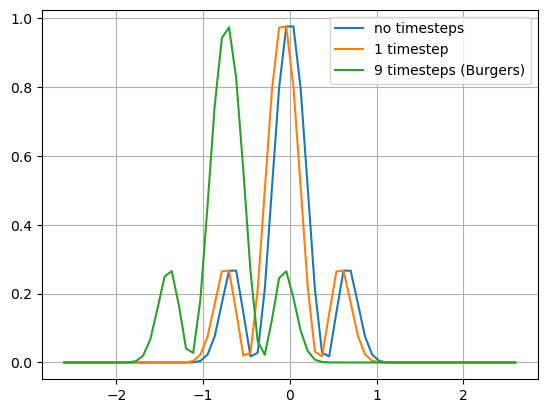

In [5]:
# Plots to check advancement in time 
plt.plot(xx, uu, label='no timesteps')
plt.plot(xx, uu + rhs*dt, label='1 timestep') # Advance one step in time using step_adv_burgers 

# Advance further in time 
t, unnt = nm.evolv_adv_burgers(xx, u(xx), nt, a=-1)
plt.plot(xx, unnt[:,9], label='9 timesteps (Burgers)')
plt.legend(loc='upper right')

<span style="color:pink">

In the graph above, we ensure that the advancement in time looks correct for one timestep, indicating that the step function (which gives the timestep and the right hand side) calculates the correct values. 

From the plot, it also looks like `evolv_adv_burgers()` has been implemented correctly, as the advancement in time is as expected. The resolution is somewhat limited due to the small number of intervals.

</span>

Carry out many steps in time so you can clearly understand the mathematical nature of the solution of the equation. For example, in Python, you can _matplotlib.animation_ to see the evolution. 

In [6]:
## Initialize constants and variables 
nint = 64 
nump = 65 
xx = np.linspace(x0, xf, nint)
uu = u(xx)

nt = 200

t, unnt = nm.evolv_adv_burgers(xx, u(xx), nt, a)

# Animation 
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(xx,unnt[:,0])

def animate(i):
    axes.clear()
    axes.plot(xx,unnt[:,i])
    axes.set_title('t=%.2f'%t[i])
    axes.set_ylim((0,1.05))
    axes.grid(True)
    
anim = FuncAnimation(fig, animate, interval=1, frames=nt, init_func=init)
plt.close()
HTML(anim.to_jshtml())

<span style="color:pink">

The animation above shows the evolution of the spatial derivative of the function from equation 2) over time. 
The function is diffusing over time. Numerical diffusion is a difficulty with computer simulations of continua (such as fluids) wherein the simulated medium exhibits a higher diffusivity than the true medium. Such diffusivity may lead to a reduction in the amplitude of the function over time, as seen in the animation. By increasing the number of intervals, we can reduce the size of each interval and capture more details of the function. This can help to mitigate the effect of numerical diffusion and preserve the amplitude of the function over time.

</span>

## 6 – Comparison with the exact solution.

Through one of the theory sessions, we know the exact solution of eq. (1) for the initial condition (2). Draw the exact solution on top of the numerical one using a dashed line. Then, explain the mathematical behavior of the solution. __Important note__: consider that the initial condition is eq (2) in $[x_0, x_f]$, _with periodic conditions at the boundaries_. In other words, the initial condition consists of an infinite repetition of the function (2) you represented between $[x_0, x_f]$ next to each other. Use this fact when comparing your numerical solution with the analytical one. __Hint__: if you consider points starting within the interval $(x_0, x_f)$ and moving with speed $a$, they will go outside the domain after some time. Use mod operator (\% in Python) to bring them back into the domain respecting the periodicity of the problem or _numpy.pad_ to pad ghost points, i.e., points out of the numerical domain, which will allow defining the boundaries, at both ends of the numerical domain. NumPy.pad allows various types of boundaries.

In [7]:
def u_exact(x, t, a): 
    r""" 
    Solves the exact solution of u(x,t) when a=const, u(x,t) = u0(x-at)

    Requires
    ----------
    Some function to define u(x,t=t0)

    Parameters
    ----------
    x : `array`
       Spatial axis. 
    t : `array`
        Time axis. 
    a : `float` or `array`
        Either constant, or array which multiply the right hand side of the Burger's eq.

    Returns
    ------- 
    uu : `array`
        Spatial and time evolution of u(x,t) = u0(x-at)
    """
    
    uu = np.zeros((len(x), len(t)))
    u_tmp = np.zeros((len(x), len(t)))

    for i in range(0, len(t)): 
        # Sets boundaries using mod (bring solution back into domain)
        # Taking mod of the length of the grid (2.6) returns the remainder of the divide 
        # -> The right column and row         
        u_tmp[:,i] = ((x - a*t[i]) - x0) % (xf - x0) + x0 

        # Insert into u0
        uu[:,i]    = u(u_tmp[:,i]) # u0(x-at)
    return uu

We implement the exact solution when $a$ is constant, $u(x,t) = u_0(x - at)$. 

In [21]:
## Initialize constants and variables 
nint = 64 
nump = nint - 1
nt = 300
xx = np.arange(nump)/(nump-1.0) * (xf - x0) + x0

t, unnt = nm.evolv_adv_burgers(xx, u(xx), nt, a)
unnt_exact = u_exact(xx, t, a)

N = 10
# Animation 
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(xx,unnt[:,::N][:,0])

def animate(i):
    axes.clear()
    axes.plot(xx,unnt[:,::N][:,i])
    axes.plot(xx,unnt_exact[:,::N][:,i], linestyle='--')
    axes.set_title('t=%.2f'%t[i])
    axes.set_ylim((0,1.05))
    axes.grid(True)
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::N]), init_func=init)
plt.close()
HTML(anim.to_jshtml())

In [23]:
## Initialize constants and variables 
nint = 256
nump = nint - 1
nt = 500
xx = np.arange(nump)/(nump-1.0) * (xf - x0) + x0

t, unnt = nm.evolv_adv_burgers(xx, u(xx), nt, a)
unnt_exact = u_exact(xx, t, a)

N = 10
# Animation 
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(xx,unnt[:,::N][:,0])

def animate(i):
    axes.clear()
    axes.plot(xx,unnt[:,::N][:,i])
    axes.plot(xx,unnt_exact[:,::N][:,i], linestyle='--')
    axes.set_title('t=%.2f'%t[i])
    axes.set_ylim((0,1.05))
    axes.grid(True)
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::N]), init_func=init)
plt.close()
HTML(anim.to_jshtml())

<span style="color:pink">

Increasing the number of intervals makes the solution more accurate over a longer period of time, but requires more computational time. More timesteps are also needed to advance the function further in time, compared to when implementing fewer intervals. 

</span>

Add a CI/CD pipeline to run this test and validate each push commit. This lets us know if a specific submitted change damages the existing code. For this, fill in ./github/workflows/test.yml

<span style="color:pink">

The test is added in `nm_lib/nm_lib/test`, and it asserts that when nt=200 and the number of intervals is 256, the solution is stable for all points. 

</span>

## 7 – Resolution increase in space and time. 

Let us repeat the calculation of the previous paragraphs, increasing the number of space intervals by factors of 2. Check if the numerical solution gets increasingly close to the analytical solution. Important: the comparison must be made _for the same values of $x$ and $t$ for all resolutions you check_. Choose a fixed time when the traveling function has already gone through the whole domain a few times. 

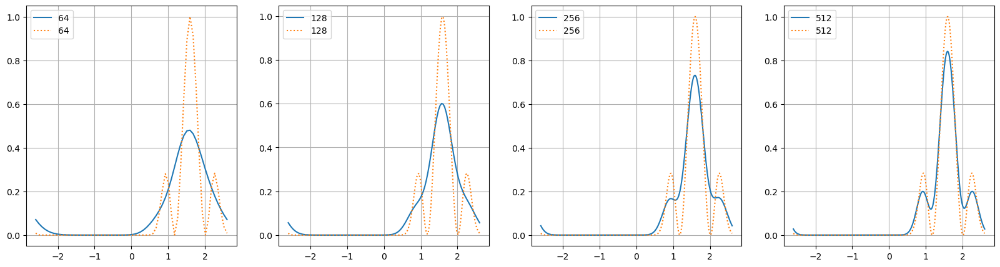

In [24]:
nint_list = [64, 128, 256, 512]
nt = 10000
error_list = np.zeros(len(nint_list))

fig, ax = plt.subplots(1, 4, figsize=(20,5))

i = 0
for nint in nint_list: 
    nump = nint - 1
    xx = np.arange(nump)/(nump-1.0) * (xf - x0) + x0

    t, unnt = nm.evolv_adv_burgers(xx, u(xx), nt, a)
    unnt_exact = u_exact(xx, t, a)
    
    error_list[i] = np.mean(np.abs(unnt[-1,:] - unnt_exact[-1,:]))

    t_ind = np.where(np.isclose(t, 110.0, 0.4))[0][0]

    ax[i].plot(xx, unnt[:,t_ind], label = f'{nint}')
    ax[i].plot(xx, unnt_exact[:,t_ind], label=f'{nint}', linestyle=':') 
    ax[i].legend()
    i += 1

<span style="color:pink">

The numerical solution does get increasingly close to the analytical solution. 

</span>

<span style="color:green">JMS</span>.

<span style="color:blue">Great job! This task is complete</span>.

<span style="color:blue">Nice error analysis, so the slope is almost 1 and not 2 like for the spatial derivatives.</span>.

<span style="color:pink">

We compute the mean error for each case and plot this vs the number of grid points using a logarithmic scale. The error decreases as the number of interval increases. 

</span>

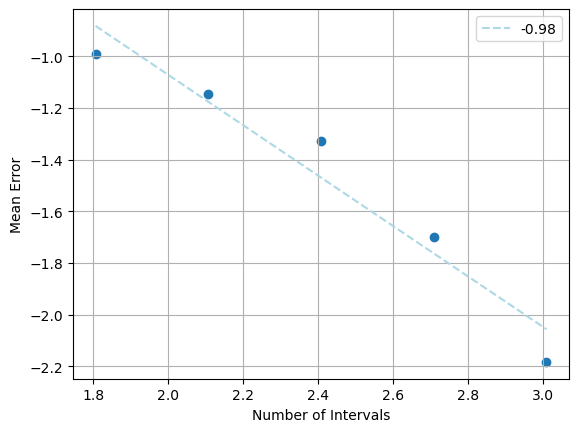

In [35]:
nint_list = [64, 128, 256, 512, 1024]
nt = 10000
error_list = np.zeros(len(nint_list))

i = 0
for nint in nint_list: 
    nump = nint - 1
    xx = np.arange(nump)/(nump-1.0) * (xf - x0) + x0

    t, unnt = nm.evolv_adv_burgers(xx, u(xx), nt, a)
    unnt_exact = u_exact(xx, t, a)
    
    error_list[i] = np.mean(np.abs(unnt[-1,:] - unnt_exact[-1,:]))

    i += 1

p  = np.poly1d(np.polyfit(np.log10(nint_list), np.log10(error_list), deg=1))
slope = p.coef[0]

plt.plot(np.log10(nint_list), p(np.log10(nint_list)), color='lightblue', linestyle='--', label=f"{slope:.2f}")
plt.scatter(np.log10(nint_list), np.log10(error_list), marker='o')
plt.xlabel('Number of Intervals')
plt.ylabel('Mean Error')
plt.legend()

<span style="color:pink">

Doing this when its evolving in time we find that the order does not depend on the derivative, but rather the timestep. The slope is almost 1, not 2 as we found for the spatial derivatives. This first-order method has an error that decreases proportional to the step size. 

</span>